# Vehicle Detection and Tracking

### The Goal of this Project

In this project, your goal is to write a software pipeline to identify vehicles in a video from a front-facing camera on a car.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2
import random
import pickle
import csv
from tqdm import tqdm
from skimage.feature import hog
%matplotlib inline

Load examples of car and not car images form training dataset.

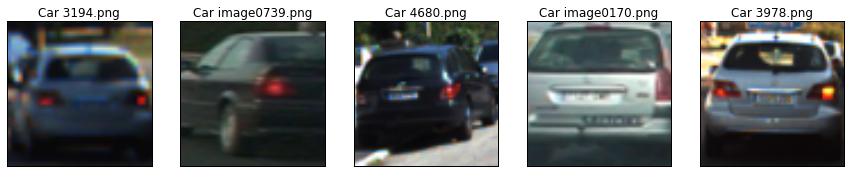

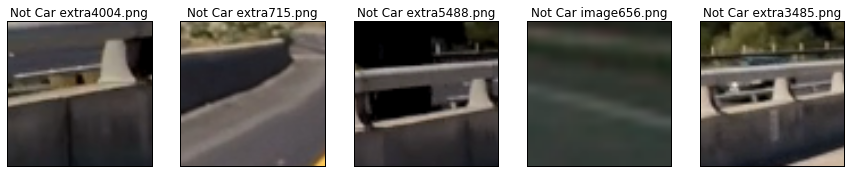

In [2]:
car_images = glob.glob('./Training/vehicles/*/*.png')
notcar_images = glob.glob('./Training/non-vehicles/*/*.png')

class ImageInfo:
    def __init__(self, img, title=None, cmap=None):
        self.img = img
        self.title = title
        self.cmap = cmap

def get_random_examples(img_files, pfx='', num_examples=5):
    examples = []
    for i in np.random.randint(0, high=len(img_files), size=num_examples):
        image = mpimg.imread(img_files[i])
        title = pfx + ' ' + img_files[i].split('/')[-1]
        examples.append(ImageInfo(image, title))
    return examples

def plot_images(img_list, size=(15,5), ncols=5):
    nrows=(len(img_list) + ncols - 1)//ncols
    plt.figure(figsize=size)
    pltnum = 1
    for imginfo in img_list:
        plt.subplot(nrows, ncols, pltnum)
        plt.imshow(imginfo.img, cmap=imginfo.cmap)
        if imginfo.title is not None:
            plt.title(imginfo.title, fontdict={'fontsize':12})
        plt.xticks([])
        plt.yticks([])
        pltnum += 1

car_examples = get_random_examples(car_images, pfx='Car')
plot_images(car_examples)

notcar_examples = get_random_examples(notcar_images, pfx='Not Car')
plot_images(notcar_examples)

Extract HOG features from all channels of YCrCb color space image

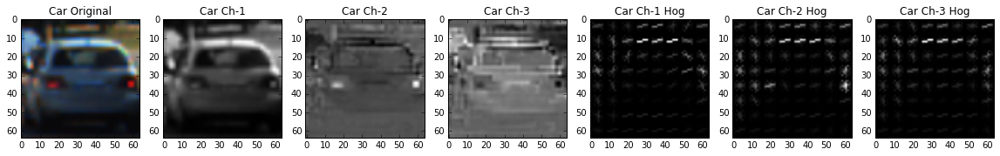

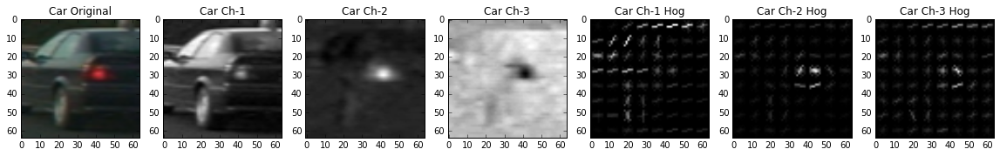

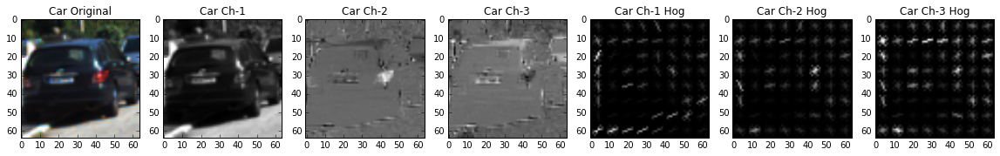

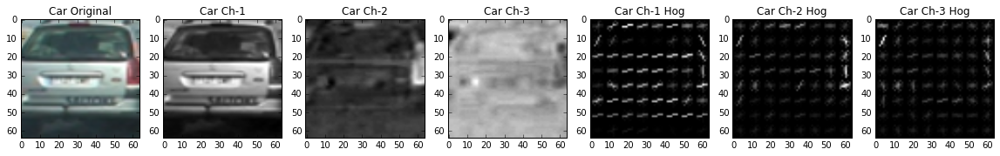

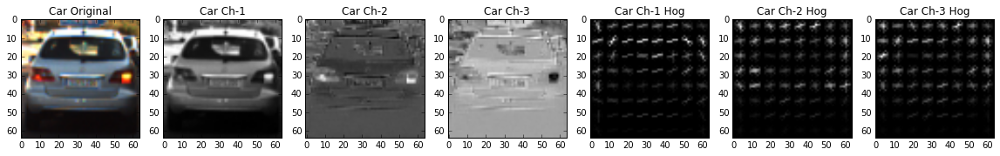

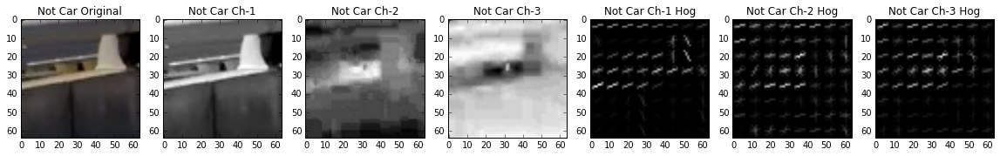

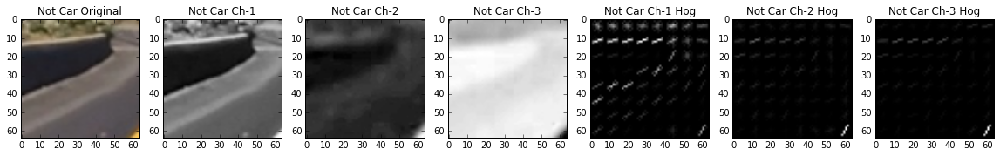

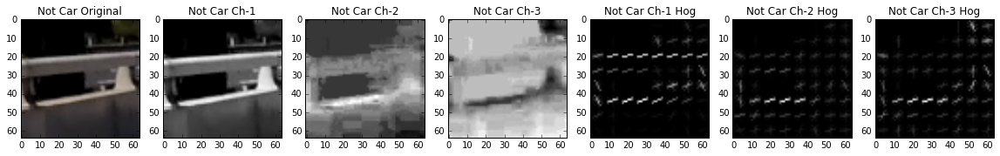

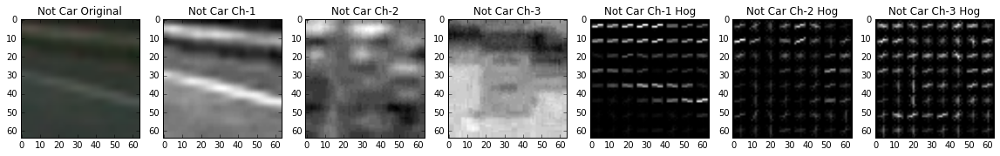

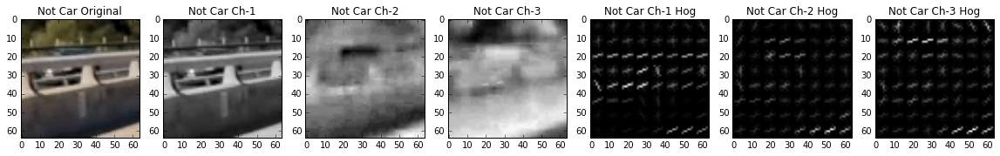

In [3]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                     vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), visualise=vis,
                                  feature_vector=feature_vec, block_norm='L2-Hys')
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), visualise=vis,
                       feature_vector=feature_vec, block_norm='L2-Hys')
        return features

def cvt_color(img, color_space='RGB'):
    if color_space != 'RGB':
        if color_space == 'HSV':
            return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        if color_space == 'HLS':
            return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        if color_space == 'YUV':
            return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        if color_space == 'LUV':
            return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        if color_space == 'Lab':
            return cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
        if color_space == 'YCrCb':
            return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    return img

def test_hog_features(img, prefix, color_space='RGB'):
    trans_image = cvt_color(img, color_space)
    ch1_img = trans_image[:,:,0]
    ch2_img = trans_image[:,:,1]
    ch3_img = trans_image[:,:,2]
    _, ch1_hog = get_hog_features(ch1_img, orient=9, pix_per_cell=8, cell_per_block=2,
                                  vis=True, feature_vec=False)
    _, ch2_hog = get_hog_features(ch2_img, orient=9, pix_per_cell=8, cell_per_block=2,
                                  vis=True, feature_vec=False)
    _, ch3_hog = get_hog_features(ch3_img, orient=9, pix_per_cell=8, cell_per_block=2,
                                  vis=True, feature_vec=False)
    
    fig, axs = plt.subplots(ncols=7, figsize=(20,5))
    axs[0].imshow(img)
    axs[0].set_title(prefix + ' Original')
    axs[1].imshow(ch1_img, cmap='gray')
    axs[1].set_title(prefix + ' Ch-1')
    axs[2].imshow(ch2_img, cmap='gray')
    axs[2].set_title(prefix + ' Ch-2')
    axs[3].imshow(ch3_img, cmap='gray')
    axs[3].set_title(prefix + ' Ch-3')
    axs[4].imshow(ch1_hog, cmap='gray')
    axs[4].set_title(prefix + ' Ch-1 Hog')
    axs[5].imshow(ch2_hog, cmap='gray')
    axs[5].set_title(prefix + ' Ch-2 Hog')
    axs[6].imshow(ch3_hog, cmap='gray')
    axs[6].set_title(prefix + ' Ch-3 Hog')

color_space = 'YCrCb'
for i in range(len(car_examples)):
    test_hog_features(car_examples[i].img, 'Car', color_space)
    
for i in range(len(notcar_examples)):
    test_hog_features(notcar_examples[i].img, 'Not Car', color_space)

Extract color histogram and spatial binning features

In [4]:
def bin_spatial(img, size=(32, 32)):
    return cv2.resize(img, size).ravel()

def color_hist(img, nbins=32):
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    return np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))

Below functions extract color and hog features from input images and create a single feature vector that can be passed on to SVM. We also flip images left right to double number of examples and generalize SVM better.

In [5]:
def single_img_features(img, color_space='RGB', spatial_size=(32,32), hist_bins=32,
                        orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feature=True, hist_feature=True, hog_feature=True):
    file_features = []
    img = cvt_color(img, color_space)
    
    if spatial_feature:
        file_features.append(bin_spatial(img, size=spatial_size))
    if hist_feature:
        file_features.append(color_hist(img, nbins=hist_bins))
    if hog_feature:
        features_hog = []
        if hog_channel == 'ALL':
            for channel in range(img.shape[2]):
                features_hog.append(get_hog_features(img[:,:,channel], orient, pix_per_cell, cell_per_block))
        else:
            features_hog.append(get_hog_features(img[:,:,hog_channel], orient, pix_per_cell, cell_per_block))
        
        features_hog = np.ravel(features_hog)
        file_features.append(features_hog)

    return np.concatenate(file_features)

def extract_features(imgs, desc, color_space='RGB', spatial_size=(32,32), hist_bins=32,
                     orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feature=True, hist_feature=True, hog_feature=True):
    features = []
    for im_file in tqdm(imgs, desc):
        img = mpimg.imread(im_file)
        img_list = [img, cv2.flip(img, 1)]
        for img in img_list:
            single_features = single_img_features(img, color_space, spatial_size, hist_bins,
                                                  orient, pix_per_cell, cell_per_block, hog_channel,
                                                  spatial_feature, hist_feature, hog_feature)
        features.append(single_features)
    return features

With multiple trial and errors and peeking into forum suggestions, I have come up with following set of parameters for feature extraction

In [6]:
# Parameters to extract features
color_space = 'YCrCb'
spatial_size=(16,16)
hist_bins=32
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'
spatial_feature = True
hist_feature = True
hog_feature = True

Extract features from car and not car images from taining data set.

In [7]:
# Extract features for training
car_features = extract_features(car_images, 'Extracting car features', color_space, spatial_size,
                                hist_bins, orient, pix_per_cell, cell_per_block, hog_channel,
                                spatial_feature, hist_feature, hog_feature)

notcar_features = extract_features(notcar_images, 'Extracting not car features', color_space, spatial_size,
                                   hist_bins, orient, pix_per_cell, cell_per_block, hog_channel,
                                   spatial_feature, hist_feature, hog_feature)

Extracting not car features: 100%|██████████| 8968/8968 [02:29<00:00, 57.39it/s]


Save extracted features to pickle file

In [8]:
car_feature_file = "car_features.p"
notcar_feature_file = "notcar_features.p"

with open(car_feature_file, "wb") as f:
    pickle.dump(car_features, f)
    
with open(notcar_feature_file, "wb") as f:
    pickle.dump(notcar_features, f)

Load features from pickle file

In [9]:
car_feature_file = "car_features.p"
notcar_feature_file = "notcar_features.p"

with open(car_feature_file, "rb") as f:
    car_features = pickle.load(f)
    
with open(notcar_feature_file, "rb") as f:
    notcar_features = pickle.load(f)

Prepare features for feeding into SMV: normalize, label them and split in training and test features

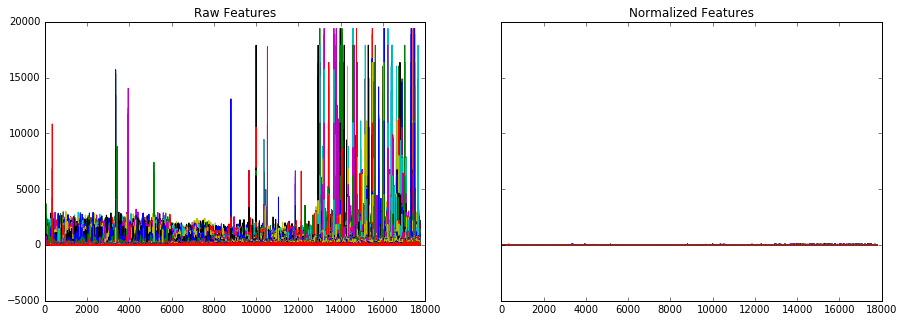

In [10]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

X = np.vstack((car_features, notcar_features)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2)

fig,axs = plt.subplots(ncols=2, sharey=True, figsize=(15,5))
axs[0].plot(X)
axs[0].set_title('Raw Features')
axs[1].plot(scaled_X)
axs[1].set_title('Normalized Features')

Now train with a linear SVM classifier with above feature sets

In [11]:
from sklearn.svm import LinearSVC

svc = LinearSVC()
svc.fit(X_train, y_train)
print('Test Accuracy = ', round(svc.score(X_test, y_test), 4))

Test Accuracy =  0.987


Save trained classifier to pickle file

In [12]:
model_file = 'svc_model.p'
with open(model_file, "wb") as f:
    pickle.dump(svc, f)

Load classifier from saved file

In [13]:
model_file = 'svc_model.p'
with open(model_file, "rb") as f:
    svc = pickle.load(f)

## Preprocessing
Some of the images in project track video are darker because of tree shades. These patches of tree shades are sometimes picked up by classifier as car images (false positives). To evaluate darkness of the image, we use a simple measure of mean pixel value of grayscale image. Below examples show mean pixel values for test images.

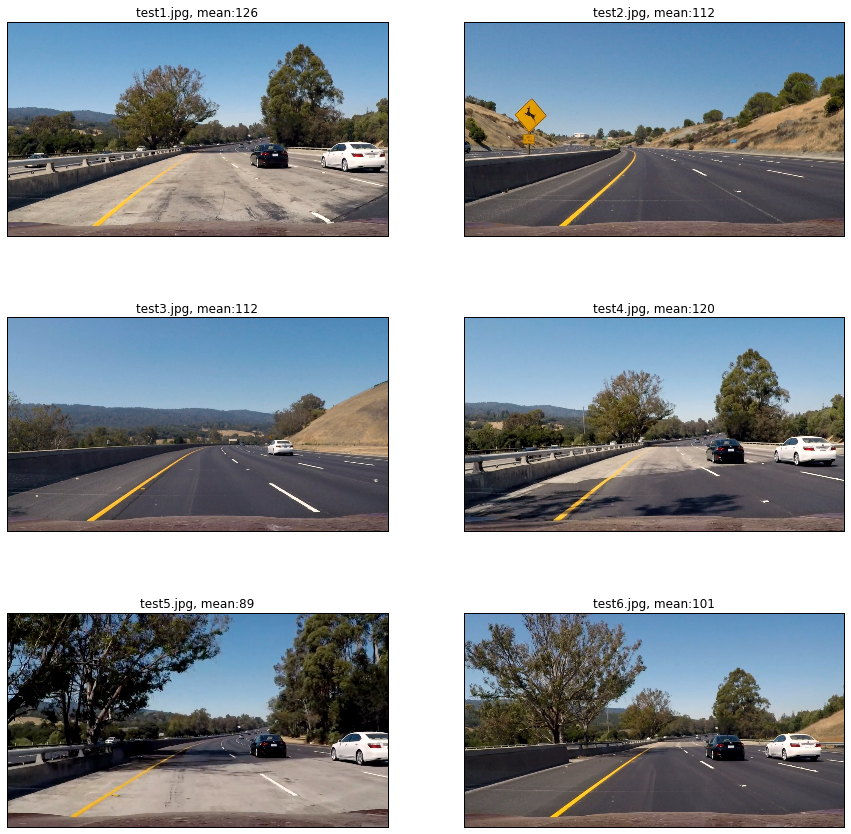

In [14]:
def get_pixels_mean(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return np.mean(gray, dtype=np.uint32)

images = []
for test_file in sorted(glob.glob('./test_images/test*.jpg')):
    test_img = mpimg.imread(test_file)
    mean = get_pixels_mean(test_img)
    title = test_file.split('/')[-1] + ', mean:{}'.format(mean)
    images.append(ImageInfo(test_img, title ))
    
plot_images(images, size=(15, 15), ncols=2)

I have used Gamma correction (Power Law Transform) to improve visibility of darker images. Code below is adapted from [pyimagesearch](https://www.pyimagesearch.com/2015/10/05/opencv-gamma-correction/). Gamma correction is adapted to darkness (mean pixel value) of image, darker the image, more the gamma correction value.

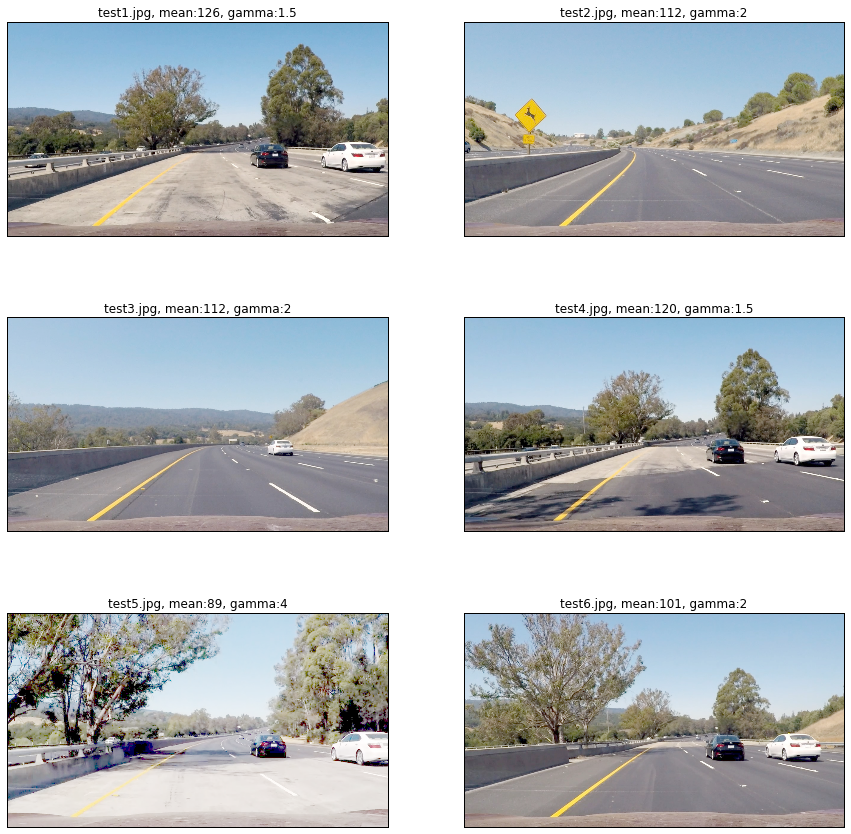

In [15]:
def adjust_gamma(img, debug=False):
    mean = get_pixels_mean(img)
    if mean < 100:
        gamma = 4
    elif mean < 120:
        gamma = 2
    elif mean < 150:
        gamma = 1.5
    else:
        if debug:
            return mean, gamma, img
        else:
            return img
    table = np.array([((i/255.0)**(1/gamma))*255 for i in range(256)]).astype(np.uint8)
    if debug:
        return mean, gamma, cv2.LUT(img, table)
    else:
        return cv2.LUT(img, table)

images = []
for test_file in sorted(glob.glob('./test_images/test*.jpg')):
    test_img = mpimg.imread(test_file)
    mean, gamma, gamma_img = adjust_gamma(test_img, debug=True)
    title = test_file.split('/')[-1] + ', mean:{}, gamma:{}'.format(mean, gamma)
    images.append(ImageInfo(gamma_img, title))
    
plot_images(images, size=(15, 15), ncols=2)

To improve contrast in images, I have used Contrast Limited Adaptive Histogram Equalization as described in [OpenCV Tutorial](https://docs.opencv.org/3.1.0/d5/daf/tutorial_py_histogram_equalization.html). In conjuction to Gamma correction, below cell tries following two orders
1. Equilization after Gamma Correction
2. Gamma Correction after Equilization
With trials on project images, 2 does better job of detection than 1.

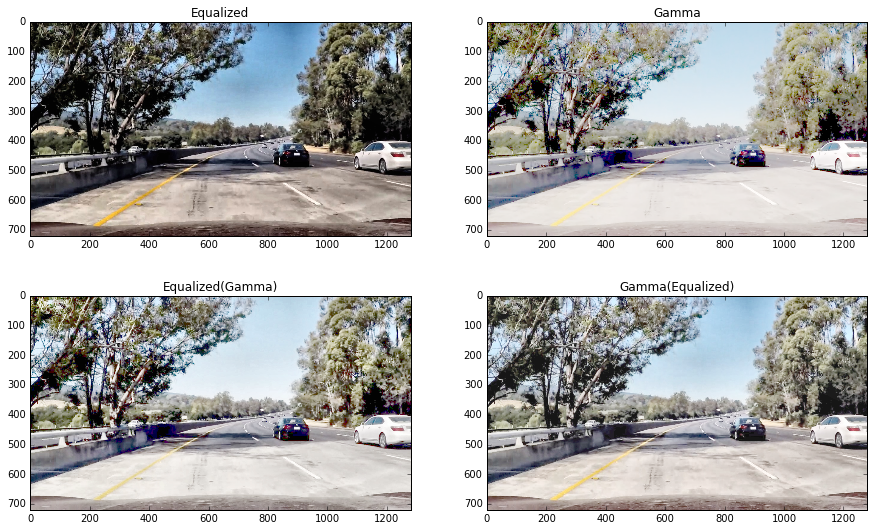

In [16]:
def equalize_histogram(img):
    yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    yuv[:,:,0] = clahe.apply(yuv[:,:,0])
    return cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)

test_img = mpimg.imread('./test_images/test5.jpg')
equal_img = equalize_histogram(test_img)
gamma_img = adjust_gamma(test_img)
equal_gamma_img = equalize_histogram(gamma_img)
gamma_equal_img = adjust_gamma(equal_img)
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15,9))
axs[0][0].imshow(equal_img)
axs[0][0].set_title('Equalized')
axs[0][1].imshow(gamma_img)
axs[0][1].set_title('Gamma')
axs[1][0].imshow(equal_gamma_img)
axs[1][0].set_title('Equalized(Gamma)')
axs[1][1].imshow(gamma_equal_img)
axs[1][1].set_title('Gamma(Equalized)')

## Sliding Window Search
Following cell implements sliding windows search to predict car images as described in lesson videos, code is more or less same as quizes. We use three sliding window sizes 96x96, 80x80, 64x64 with 85% overlap

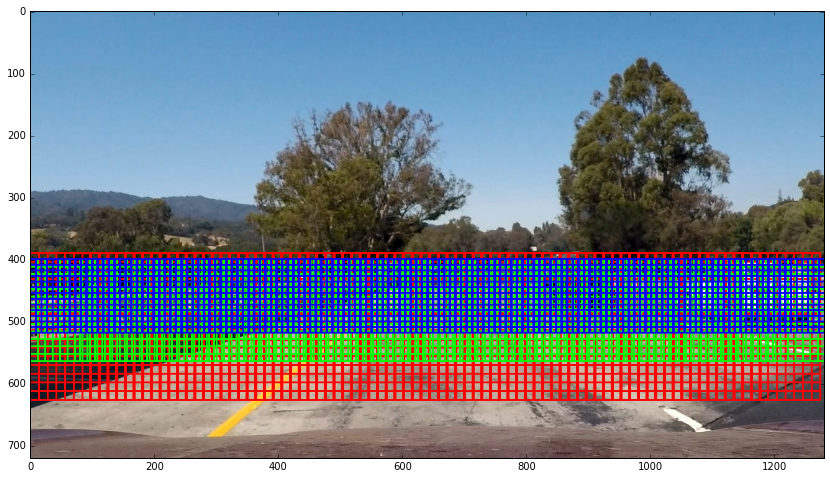

In [17]:
def draw_boxes(img, bboxes, color=(255, 255, 0), thick=2):
    imcopy = np.copy(img)
    for bbox in bboxes:
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    return imcopy

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                 xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    img = img.astype(np.float32)/255
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
        
    window_list = []
    x_span = x_start_stop[1] - x_start_stop[0]
    y_span = y_start_stop[1] - y_start_stop[0]
    x_pix_per_step = int(xy_window[1]*(1 - xy_overlap[1]))
    y_pix_per_step = int(xy_window[0]*(1 - xy_overlap[0]))
    x_last_no_overlap = int(xy_window[1]*xy_overlap[1])
    y_last_no_overlap = int(xy_window[0]*xy_overlap[0])
    nx_windows = (x_span - x_last_no_overlap)//x_pix_per_step
    ny_windows = (y_span - y_last_no_overlap)//y_pix_per_step

    for ys in range(ny_windows):
        for xs in range(nx_windows):
            startx = xs*x_pix_per_step + x_start_stop[0]
            starty = ys*y_pix_per_step + y_start_stop[0]
            endx = startx + xy_window[1]
            endy = starty + xy_window[0]
            window = ((startx, starty), (endx, endy))
            window_list.append(window)
    return window_list

def create_multiscale_windows(img, display=False):
    window_list = []
  
    y_start_stop = ((390, 630), (400, 570), (400, 520))
    overlap = 0.85
    slide_window_sizes = (96, 80, 64)
    color_list = ((255, 0, 0), (0, 255, 0), (0, 0, 255))
    win_img = img
    for window_size, color, y_range in zip(slide_window_sizes, color_list, y_start_stop):
        windows = slide_window(img, y_start_stop=y_range, xy_window=(window_size, window_size),
                               xy_overlap=(overlap, overlap))
        if display:
            win_img = draw_boxes(win_img, windows, color=color)
        window_list += windows
    
    if display:
        plt.figure(figsize=(15,8))
        plt.imshow(win_img)
            
    return window_list

test_img = mpimg.imread('./test_images/test1.jpg')
windows = create_multiscale_windows(test_img, display=True)

Using above sliding windows, extract features from the each window pixels and use linear SVM classifier to select windows predicting containment of car images. Note that the classifier was trained on png images with scale of 0.0 to 1.0, we need to convert images from project video to same scale and normalize features extracted before feeding these to classifier. Again, code below is adapted from lesson quizes.

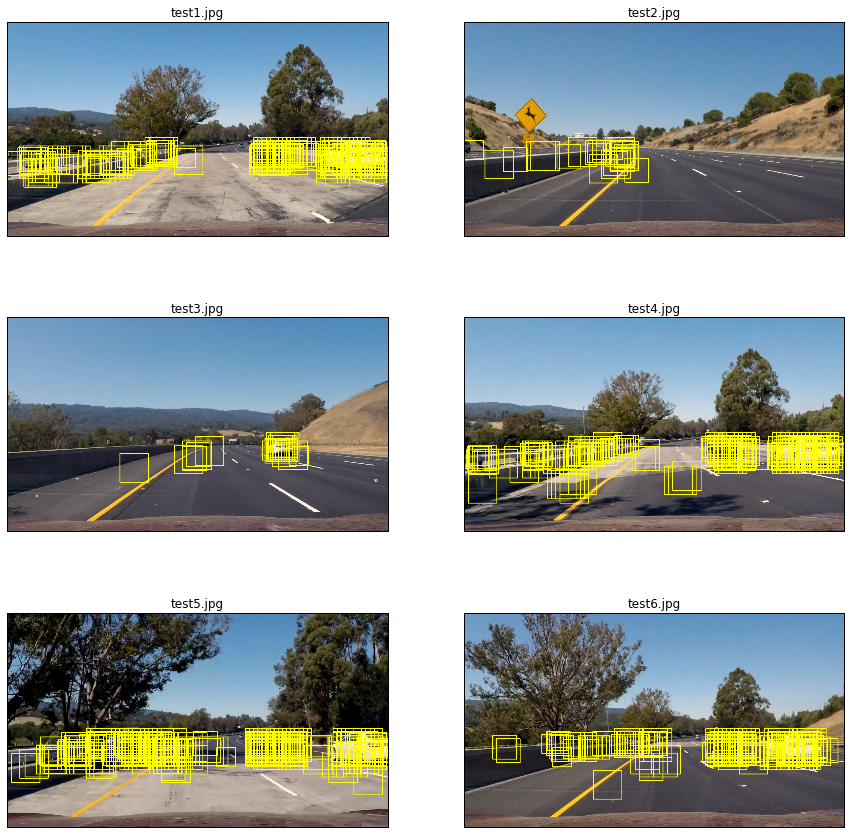

In [18]:
def search_windows(img, windows, clf, scaler, color_space='RGB',
                   spatial_size=(32,32), hist_bins=32, orient=9,
                   pix_per_cell=8, cell_per_block=2, hog_channel=0,
                   spatial_feature=True, hist_feature=True, hog_feature=True):  
    img = equalize_histogram(img)
    img = adjust_gamma(img)
    img = img.astype(np.float32)/255
    windows_match = []
    for window in windows:
        window_crop = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))
        features = single_img_features(window_crop, color_space, spatial_size, hist_bins,
                                       orient, pix_per_cell, cell_per_block, hog_channel,
                                       spatial_feature, hist_feature, hog_feature)
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        prediction = clf.predict(test_features)
        if prediction == 1:
            windows_match.append(window)
    
    return windows_match

detected_images = []
for test_file in sorted(glob.glob('./test_images/test*.jpg')):
    test_img = mpimg.imread(test_file)
    equal_img = equalize_histogram(test_img)
    gamma_img = adjust_gamma(equal_img)
    
    windows = create_multiscale_windows(test_img)
    hot_windows = search_windows(gamma_img, windows, svc, X_scaler, color_space, spatial_size, \
                                 hist_bins, orient, pix_per_cell, cell_per_block, hog_channel)
    win_img = draw_boxes(test_img, hot_windows)
    title = test_file.split('/')[-1]
    detected_images.append(ImageInfo(win_img, title))
    
plot_images(detected_images, size=(15, 15), ncols=2)

There are lots of false positive windows in above images, we will deal with them later.

### HOG Sub-sampling Window Search
Next we implement more efficient method to compute hog feature only once for the whole image search area (instead of calculating for each window). This method uses scale to govern window size. Window size is kept constant at 64x64 and image is scaled up/down to zoom in/out to change window coverage over image, it gives similar effect of changing window size. Code is copied from lesson quiz.

I have used scale of 1.5, 1.25 and 1, which is equivalent to having window size of 96x96, 80x80 and 64x64 as used in sliding window search above.

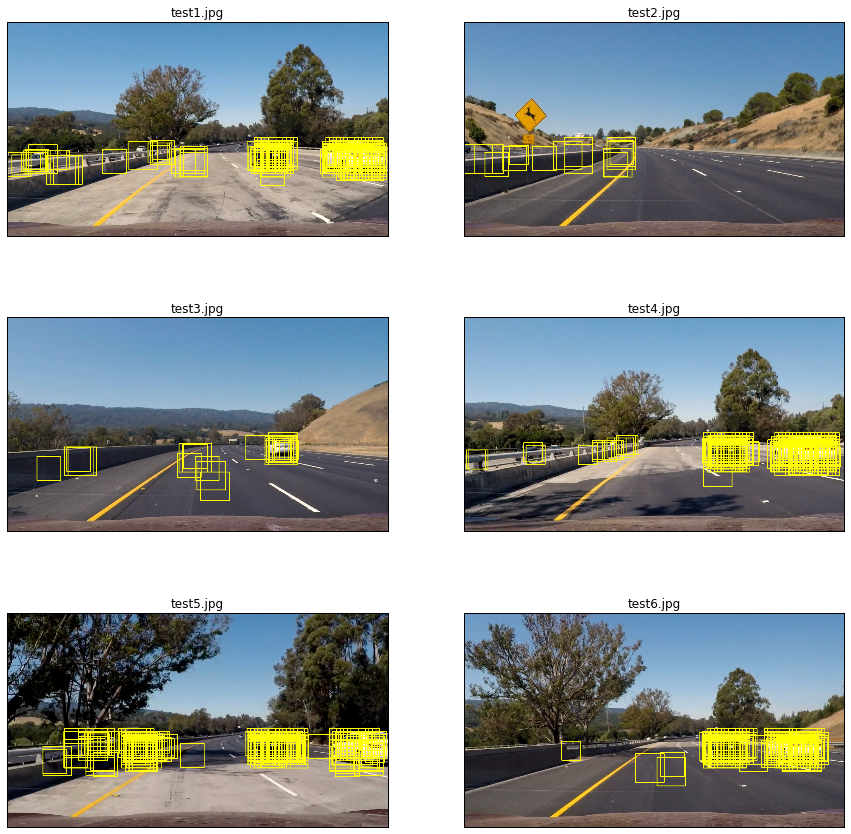

In [19]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, xstart, ystart, xstop, ystop, scale, svc, X_scaler, color_space,
              orient, pix_per_cell, cell_per_block, hog_channel, spatial_size, hist_bins):
    
    windows_match = []
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,xstart:xstop,:]
    ctrans_tosearch = cvt_color(img_tosearch, color_space)
    
    if scale != 1.0:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else:
        ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 1  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    if hog_channel == 'ALL':
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
        
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            if hog_channel == 'ALL':
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_features = hog_feat1

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                windows_match.append(((xbox_left+xstart, ytop_draw+ystart),
                                      (xbox_left+win_draw+xstart,ytop_draw+win_draw+ystart))) 
                
    return windows_match

def find_cars_multi_scale(img, svc, X_scaler, color_space, orient, pix_per_cell, cell_per_block,
                          hog_channel, spatial_size, hist_bins):
    xstart = 0
    xstop = img.shape[1]

    hot_windows = []
    for scale, yrange in zip((1.5, 1.25, 1.0), ((390, 630), (400, 570), (400, 520))):
        hot_windows += find_cars(img, xstart, yrange[0], xstop, yrange[1], scale,
                                 svc, X_scaler, color_space, orient, pix_per_cell,
                                 cell_per_block, hog_channel, spatial_size, hist_bins)
    return hot_windows

detected_images = []
for test_file in sorted(glob.glob('./test_images/test*.jpg')):
    test_img = mpimg.imread(test_file)
    equal_img = equalize_histogram(test_img)
    gamma_img = adjust_gamma(equal_img)
    hot_windows = find_cars_multi_scale(gamma_img, svc, X_scaler, color_space, orient,
                                        pix_per_cell, cell_per_block, hog_channel,
                                        spatial_size, hist_bins)
    out_img = draw_boxes(test_img, hot_windows)
    title = test_file.split('/')[-1]
    detected_images.append(ImageInfo(out_img, title))
    
plot_images(detected_images, size=(15, 15), ncols=2)


## Heatmap
Below cells implement image heatmap of candidate windows with car images. For each window, pixel values inside window is incremented by 1, pixels with maximum window overlap would get highest value. To filter out windows with higher confidence, heatmap is thresholded to exclude all pixel values below threshold.

Next we find bounding boxes on selected windows by first creating labels for connected heatmap pixel using scipy label utility, then selecting bounding window for each label. Code is taken from lessons quizes.

Some of the false detection windows may have really weird dimensions, we don't want to show them. This is filterred out by basic sanity check on width and height of the window. E.g. a window lesser than 50 pixels in either dimension.

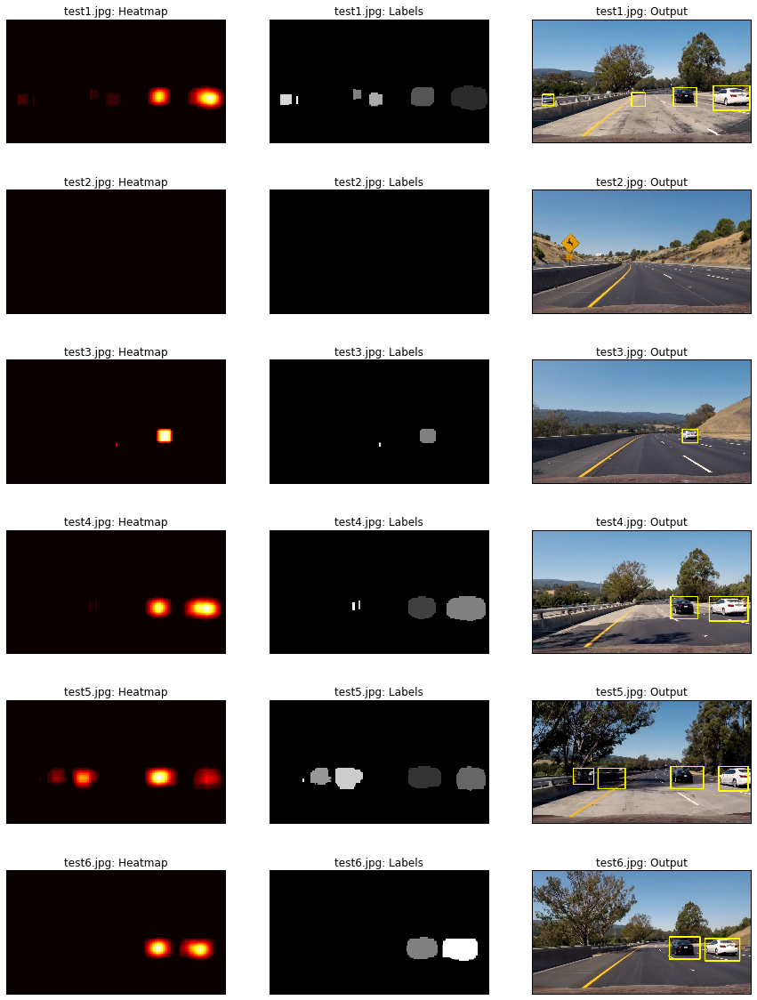

In [20]:
from scipy.ndimage.measurements import label

def add_heat(heatmap, hot_windows):
    for window in hot_windows:
        heatmap[window[0][1]:window[1][1], window[0][0]:window[1][0]] += 1
    return heatmap

def apply_threshold(heatmap, threshold=5):
    heatmap[heatmap <= threshold] = 0
    return heatmap

def box_looks_good(bbox):
    height = bbox[1][1] - bbox[0][1]
    width = bbox[1][0] - bbox[0][0]
    area = height * width
    return (area >= 2500) and (height >= 50) and (width >= 50)

def draw_labeled_bboxes(img, labels, heatmap):
    out_img = np.copy(img)
    for label_val in range(1, labels[1]+1):
        nonzero = (labels[0] == label_val).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        if box_looks_good(bbox):
            cv2.rectangle(out_img, bbox[0], bbox[1], (255,255,0), 6)
    return out_img
    
display_images = []
for test_file in sorted(glob.glob('./test_images/test*.jpg')):
    test_img = mpimg.imread(test_file)
    equal_img = equalize_histogram(test_img)
    gamma_img = adjust_gamma(equal_img)
    hot_windows = find_cars_multi_scale(gamma_img, svc, X_scaler, color_space, orient,
                                        pix_per_cell, cell_per_block, hog_channel,
                                        spatial_size, hist_bins)
    heatmap = np.zeros_like(test_img[:,:,0]).astype(np.float)
    heatmap = add_heat(heatmap, hot_windows)
    heatmap = apply_threshold(heatmap)
    heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
    title = test_file.split('/')[-1]
    display_images.append(ImageInfo(heatmap, title=title + ': Heatmap', cmap='hot'))
    
    labels = label(heatmap)
    display_images.append(ImageInfo(labels[0], title=title + ': Labels', cmap='gray'))
    
    output_image = draw_labeled_bboxes(test_img, labels, heatmap)
    display_images.append(ImageInfo(output_image, title=title + ': Output'))
    
plot_images(display_images, size=(15, 20), ncols=3)

### Left Virtual Wall
For this project video, car is running on leftmost lane with a barrier on its left. We can leverage this fact to eliminate detections from cars coming in reverse direction by putting a virtual wall along left lane. Ideally we should be putting this wall along barrier, but detecting barrier would be a separate project in itself, so we rely on left lane detection, subtract a margin of 50 pixels to get this wall. We get a left lane fit using `get_unwarped_line_fit` function from LaneDetector class in `AdvanceLaneFinding.py`. Using this virtual wall, we can eliminate all windows crossing the wall boundary. This selection of windows is implemented here with `add_heat_With_left_wall`. 

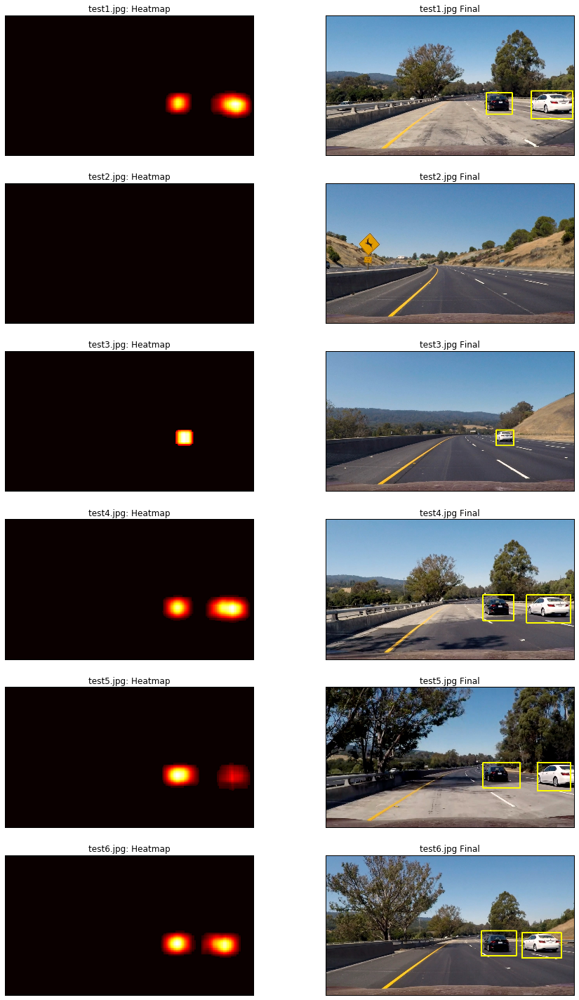

In [21]:
from AdvanceLaneFinding import LaneDetector

def x_fit(fit, y):
    return np.int32(fit[0]*y**2 + fit[1]*y + fit[2])

# Add heat from a window to heatmap if it does not cross left wall boundary
def add_heat_with_left_wall(heatmap, left_fit, hot_windows):
    for window in hot_windows:
        y1 = window[0][1]
        y2 = window[1][1]
        x1 = window[0][0]
        x2 = window[1][0]
        wall_x1 = x_fit(left_fit, y1)
        wall_x2 = x_fit(left_fit, y2)
        wall_x_max = max(wall_x1, wall_x2)
        if (x1 > wall_x_max) and (x2 > wall_x_max): 
            heatmap[y1:y2, x1:x2] += 1
    return heatmap

display_images = []
for test_file in sorted(glob.glob('./test_images/test*.jpg')):
    test_img = mpimg.imread(test_file)
    equal_img = equalize_histogram(test_img)
    gamma_img = adjust_gamma(equal_img)
    
    # detect lane markings
    lane_detector = LaneDetector(debug=True)
    lane_mask = lane_detector.process_frame(gamma_img)
    
    # Apply left wall using detected left lane markings
    left_fit = lane_detector.get_unwarped_line_fit(margin=50)
                             
    # Find candidate windows with car images
    hot_windows = find_cars_multi_scale(gamma_img, svc, X_scaler, color_space, orient,
                                        pix_per_cell, cell_per_block, hog_channel,
                                        spatial_size, hist_bins)
    
    # Apply heatmap threshold
    heatmap = np.zeros_like(gamma_img[:,:,0]).astype(np.float)
    heatmap = add_heat_with_left_wall(heatmap, left_fit, hot_windows)
    heatmap = apply_threshold(heatmap)
    heatmap = np.clip(heatmap, 0, 255)
    title = test_file.split('/')[-1]
    display_images.append(ImageInfo(heatmap, title=title + ': Heatmap', cmap='hot'))
    
    # Create output image with bounding boxes and lane markings
    labels = label(heatmap)
    out_img = draw_labeled_bboxes(test_img, labels, heatmap)
    display_images.append(ImageInfo(out_img, title + ' Final'))
    
plot_images(display_images, size=(15, 25), ncols=2)

## Video Processing

Its time to put together everything in a single class to maintain a state from previous frames. The most important state is a `deque` of heatmap from last `n_frames`. For smoother detection, an average for all frames' heatmap is calculated, also helps in eliminating false positives appearing in just one or two frames.

We also combine lane detector to create a lane mask over driving lane.

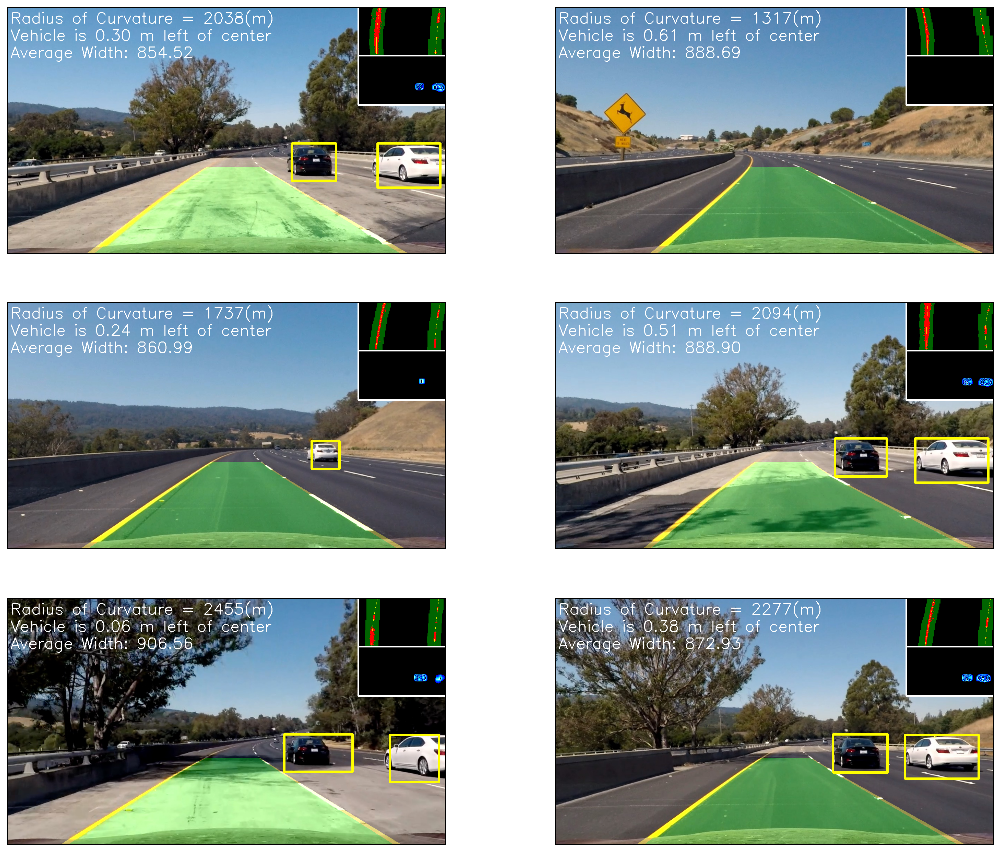

In [22]:
from collections import deque
from Calibration import Calibrate

class CarsLaneDetector:
    def __init__(self, heat_threshold=8, n_frames=10):
        self.heat_threshold = heat_threshold
        self.heatmaps = deque(maxlen=n_frames)
        self.calibrate = Calibrate()
        self.lane_detector = LaneDetector(5, debug=True)
        self.draw_img = None

    def detect_lane(self, img):
        lane_mask = self.lane_detector.process_frame(img)
        self.left_fit = self.lane_detector.get_unwarped_line_fit(margin=50)
        self.draw_img = cv2.addWeighted(self.draw_img, 1, lane_mask, 0.3, 0)
        lane_debug = self.lane_detector.get_debug_data()
        lane_debug = cv2.resize(lane_debug, (0,0), fx=0.20, fy=0.2)
        y1 = 0
        y2 = lane_debug.shape[0]
        x2 = self.draw_img.shape[1]
        x1 = x2 - lane_debug.shape[1]
        self.draw_img[y1:y2, x1:x2] = lane_debug
        cv2.rectangle(self.draw_img, (x1, y1), (x2,y2), (255, 255, 255), thickness=3)
        self.draw_img = self.lane_detector.add_metrics(self.draw_img)
        
    # Caculate average heatmap of current frame along with previous frames
    # and select based on heatmap threshold
    def get_heat_map(self, hot_windows):
        heat = np.zeros_like(self.draw_img[:,:,0]).astype(np.float)
        heat = add_heat_with_left_wall(heat, self.left_fit, hot_windows)
        self.heatmaps.append(heat)
        heat = sum(self.heatmaps)/len(self.heatmaps)
        heat = apply_threshold(heat, self.heat_threshold)
        return np.clip(heat, 0, 255).astype(np.uint8)
    
    def identify_cars(self, heat):
        # draw boxes on lane detected image for final output
        labels = label(heat)
        self.draw_img = draw_labeled_bboxes(self.draw_img, labels, heat)
        color_heat = cv2.applyColorMap(heat*10, cv2.COLORMAP_HOT)
        color_heat = cv2.resize(color_heat, (0,0), fx=0.2, fy=0.2)
        y1 = color_heat.shape[0]
        y2 = y1 + color_heat.shape[0]
        x2 = self.draw_img.shape[1]
        x1 = x2 - color_heat.shape[1]
        self.draw_img[y1:y2, x1:x2] = color_heat
        cv2.rectangle(self.draw_img, (x1, y1), (x2,y2), (255, 255, 255), thickness=3)
        
    def process_frame(self, img):
        # Preprocess image
        self.draw_img = self.calibrate.undistort(img)
        equal_img = equalize_histogram(self.draw_img)
        gamma_img = adjust_gamma(equal_img)
        
        # Detect lane markings
        self.detect_lane(img)                     
        
        # Find candidate windows with car images
        hot_windows = find_cars_multi_scale(gamma_img, svc, X_scaler, color_space, orient,
                                            pix_per_cell, cell_per_block, hog_channel,
                                            spatial_size, hist_bins)

        heat = self.get_heat_map(hot_windows)
        self.identify_cars(heat)
        
        return self.draw_img
    
display_images = []
for test_file in sorted(glob.glob('./test_images/test*.jpg')):
    test_img = mpimg.imread(test_file)
    cars_lane_detect = CarsLaneDetector()
    display_images.append(ImageInfo(cars_lane_detect.process_frame(test_img)))
    
plot_images(display_images, size=(18, 15), ncols=2)

Lets try to run above pipeline on `test_video.mp4`

In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_file="test_video.mp4"
output_video = "output_images/" + video_file
clip = VideoFileClip("./" + video_file)
cars_lane_detect = CarsLaneDetector()
marked_clip = clip.fl_image(cars_lane_detect.process_frame)
%time marked_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_images/test_video.mp4
[MoviePy] Writing video output_images/test_video.mp4


 97%|█████████▋| 38/39 [02:05<00:03,  3.31s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/test_video.mp4 

CPU times: user 2min 12s, sys: 452 ms, total: 2min 12s
Wall time: 2min 7s


Finally create output on `project_video.mp4`

In [32]:
video_file="project_video.mp4"
output_video = "output_images/" + video_file
clip = VideoFileClip("./" + video_file)
cars_lane_detect = CarsLaneDetector()
marked_clip = clip.fl_image(cars_lane_detect.process_frame)
%time marked_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


100%|█████████▉| 1260/1261 [1:10:20<00:03,  3.33s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

CPU times: user 1h 14min 14s, sys: 4.93 s, total: 1h 14min 19s
Wall time: 1h 10min 22s


In [31]:
# Use this cell to delete some unwanted stuff to free up some memory
del car_features, notcar_features
del X, scaled_X, X_train, X_test, y_train, y_test
import gc
gc.collect()

163